# Image Information

The main objectives of this module are:

* Manipulate an image with Python, scikit-image and numpy.
* Process images at the pixel level.
* Compute and understand image histograms.
* Understand lossless compression & reconstruction.
* Understand the co-occurrence matrix.
* Use different colour representations.

## 1. Read & write an image

In this exercise, we will simply open an image file, display it, and save a copy. 

**Use the [scikit-image io](https://scikit-image.org/docs/dev/api/skimage.io.html) module to open, show & save a copy of the "camera.jpg" image.**

*Note: we use the **%matplotlib inline** command to display the image in the notebook. It would not be necessary if you execute the code in the terminal or in a standard IDE like PyCharm.*

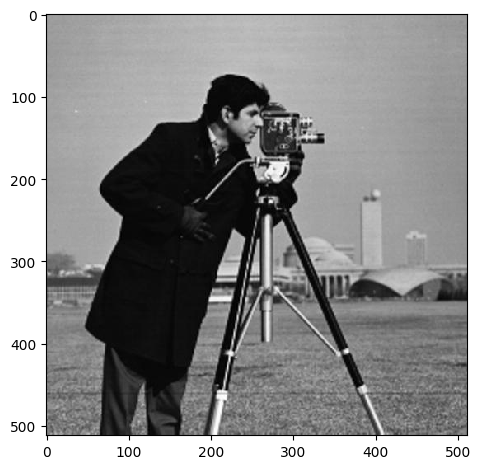

In [1]:
from skimage.io import imread,imsave,imshow
%matplotlib inline

image = imread("camera.jpg")
imshow(image)
imsave("camera_saved.jpg", image)


When you open an image with scikit-image, it is stored as a Numpy [ndarray](https://numpy.org/doc/stable/reference/generated/numpy.ndarray.html) object. Numpy arrays are objects which can be easily manipulated for numerical computations.

**Using *ndarray* methods & attributes, answer the following questions about the "camera" image:**

1. What is the shape of the image? (width & height)
1. What is the minimum pixel value? What is the maximum pixel value?
1. What is the data type for each pixel?
1. Show only a 100x100 pixels window taken at the center of the image.

Shape of the image : (512, 512)
Minimum value : 0
Maximum value : 255
Data type : uint8


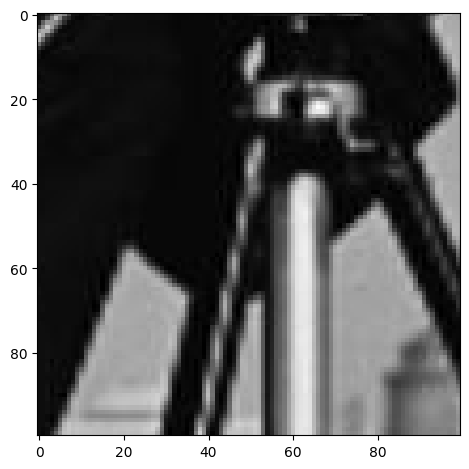

In [16]:
import numpy as np
from skimage.io import imread
import matplotlib.pyplot as plt

image = imread("camera.jpg")
# imshow(image)

# 1. shape of the image :
print("Shape of the image :", image.shape)

# 2. Minimum pixel value :
print("Minimum value :", image.min())
print("Maximum value :", image.max())

# 3. Data type
print("Data type :", image.dtype)

# 4. Show only 100x100
width, height = image.shape
size_of_window = 100
imshow(image[(width-size_of_window)//2:(width+size_of_window)//2, (height-size_of_window)//2:(height+size_of_window)//2])

**Need more help? You can check the following videos:**

* [Image I/O](https://www.youtube.com/watch?v=rgJmji4rTpw&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=1)
* [Image data type & color channels](https://www.youtube.com/watch?v=rIO1EJ--yeg&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=2)

## 2. Image histograms

* Compute and plot the **histogram** and the **normalized histogram** of the example cameraman image given below.

You can use the [pyplot module](https://matplotlib.org/api/pyplot_api.html) from matplotlib to display plots & histograms.

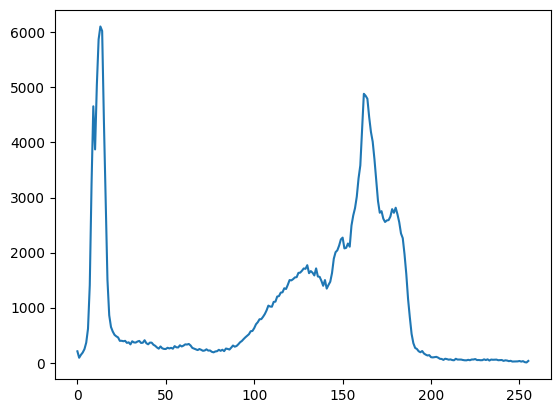

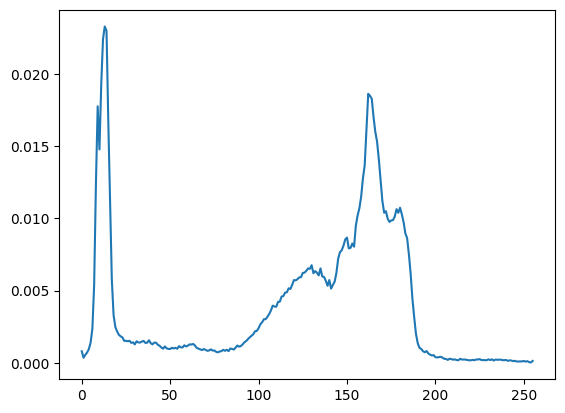

In [3]:
# Histogram
def histogram(im):
    h = [0]*256
    for v in range(256):
        h[v] = (im == v).sum()

    return h

h = histogram(image)
plt.plot(h)

# Normalized Histogram
hist = np.array(h)
norm_h = hist/hist.sum()

plt.figure()
plt.plot(range(256), norm_h)
plt.show()

Can you use the histogram to answer the following questions ? (you don't need to code anything here)

1. What is the average gray value of the cameraman ?
1. What is the average gray value of the sky ?
1. Is there more 'cameraman' pixels than 'sky' pixels ?

Compute and plot the **cumulated histogram**.

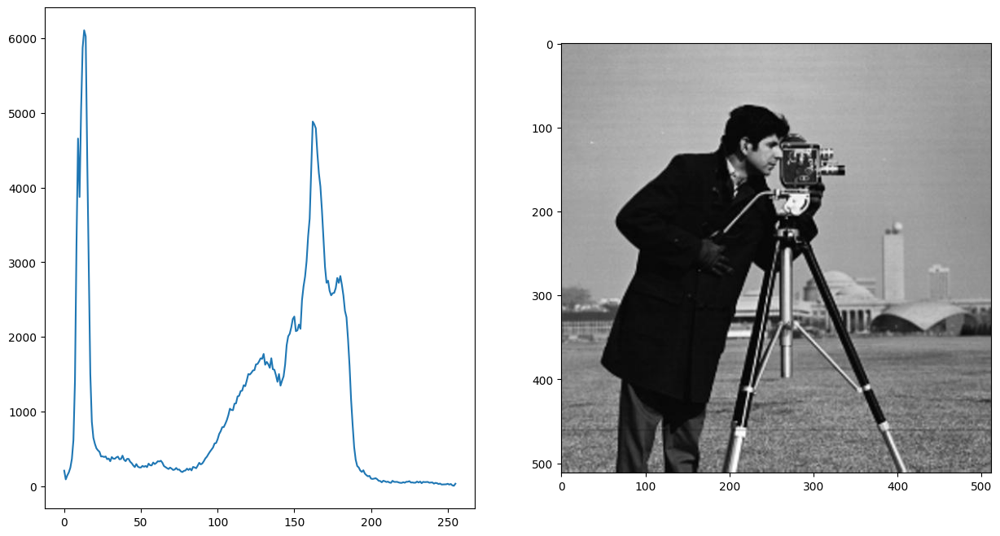

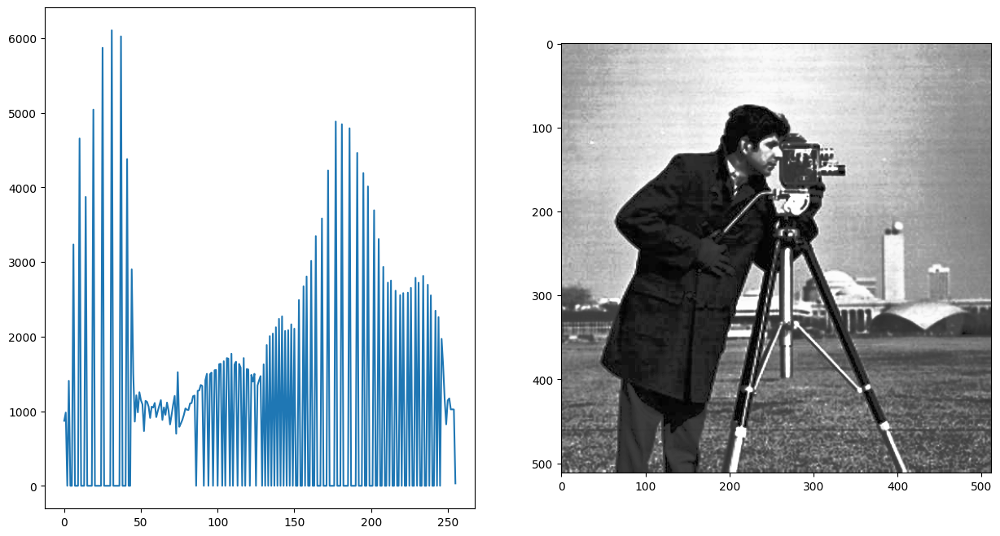

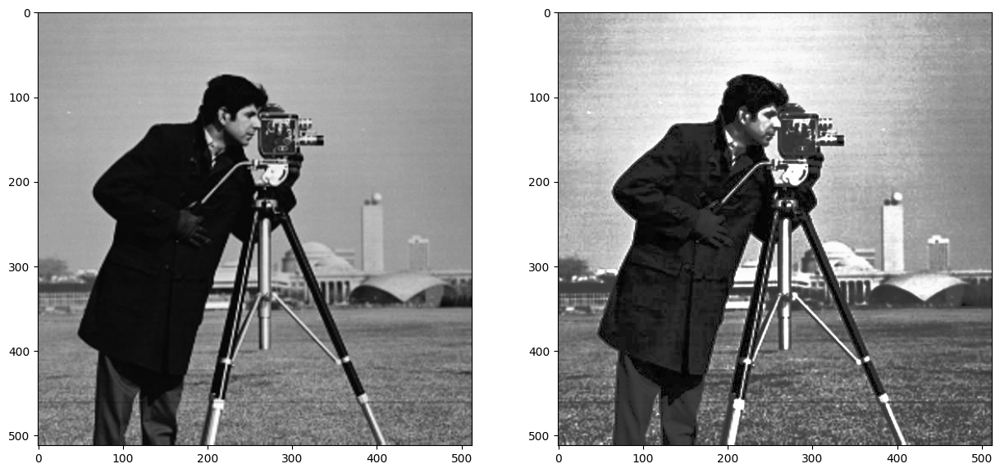

In [17]:
# Cumulated histogram
def cumulative_histogram(im):
    c_hist = [0]*256
    c_hist[0] = (im == 0).sum()
    for x in range(1, 256):
        c_hist[x] = (im == x).sum() + c_hist[x - 1]

    return c_hist

c_hist = cumulative_histogram(image)
# plt.plot(c_hist)

# Equalization of the Histogram
def equalize(im):
    c_hist = np.array(cumulative_histogram(im))
    norm_c_h = c_hist/c_hist.sum()
    lut = (norm_c_h*(255/norm_c_h.max())).astype('uint8')

    return lut[im]

equalized_im = equalize(image)

def compare_to_hist(im):
    plt.figure(figsize=[15,8])
    plt.subplot(1,2,1)
    plt.plot(histogram(im))
    plt.subplot(1,2,2)
    plt.imshow(im, cmap=plt.cm.gray)
    plt.show()

def compare(im1, im2, opt1=plt.cm.gray, opt2=plt.cm.gray):
    plt.figure(figsize=[15,8])
    plt.subplot(1,2,1)
    plt.imshow(im1, cmap=opt1)
    plt.subplot(1,2,2)
    plt.imshow(im2, cmap=opt2)
    plt.show()

compare_to_hist(image)
compare_to_hist(equalized_im)
compare(image, equalized_im)

**Need more help? You can check the following videos:**

* [Computing a greyscale histogram](https://www.youtube.com/watch?v=g6hkHQbwB0I&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=3)
* [Numpy arrays: operations, indexing, masking](https://www.youtube.com/watch?v=rPNTkrM2dZw&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=4&t=253s)
* [Normalized and cumulative histograms](https://www.youtube.com/watch?v=uCgu0-KZt1o&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=5)

## 3. Image entropy

The "entropy" of a signal, in information theory, can generally be interpreted as the "number of bits required to encode the signal". It is a measure of the "amount of information" contained in the signal. Intuitively, a signal with a very narrow distribution (all values are close to each other) will have a very low entropy, while a signal with a wide distribution (the values are evenly distributed) will have a higher entropy.

1. Compute the image entropy of the cameraman image. The image entropy is given by $e = - \sum_{g=0}^N p(g) \log_2(p(g))$ where $p(g)$ is the probability that a pixel has the grayscale value g, and N is the number of possible grayscale values. Note that p(g) is directly given by the normalized histogram.
1. What is the entropy of a shuffled version of the cameraman ?

In [5]:
image = imread('camera.jpg')

def norm_hist(h):
    h = np.array(h)
    return h/h.sum()

# Returns the probabilities of each pixel in an image
def probabilities(im):
    return norm_hist(histogram(im))

# Returns the entropy of an image
def entropy(im):
    prob = probabilities(im)
    e = 0
    for n in range(256):
        if prob[n] != 0:
            e -= prob[n] * np.log2(prob[n])
    return e

print(entropy(image))

7.065452040742872


**Need more help? You can check the following videos:**

* [Computing the image entropy](https://www.youtube.com/watch?v=L2VtGt2FsRQ&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=6)

## 4. Image compression

Using the code below as a starting point:

* **Decompose an image** by recursively subsampling its dimensions and computing the remainders, such that each level of recursion performs the following operation:

<img src='PyramidCompression.png' width='75%'/>

Image entropy : 7.065452040742872
Pyramid entropy : 3.346722744534718


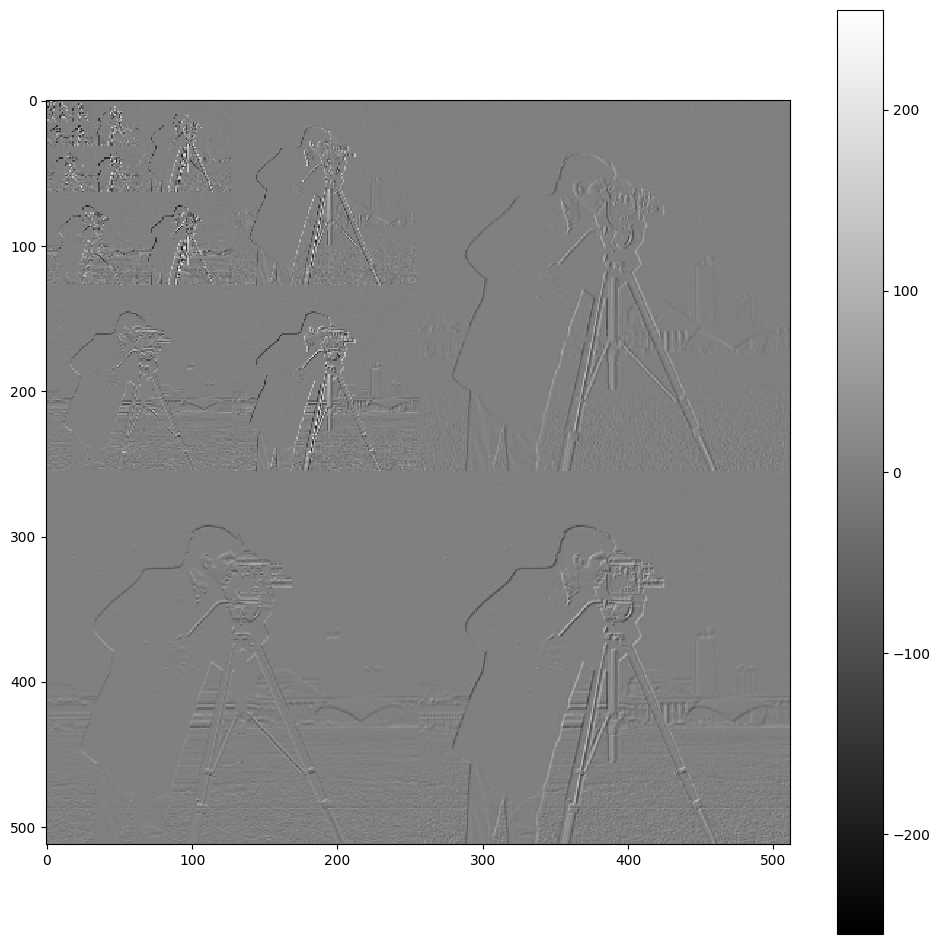

In [6]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from skimage.io import imread

image = imread("camera.jpg").astype(np.int16)

# Pyramid Compression
def split(im):
    if im.shape[0] > 1:
        a = im[0:-1:2,0:-1:2]
        b = im[0:-1:2,1::2]-a
        c = im[1::2,0:-1:2]-a
        d = im[1::2,1::2]-a
        R = np.vstack((np.hstack((split(a),b)),np.hstack((c,d))))
    else:
        R = im
    return R


s = split(image)
print("Image entropy :", entropy(image))
print("Pyramid entropy :", entropy(s))

plt.figure(figsize=(12,12))
plt.imshow(s,interpolation='nearest',cmap=cm.gray,vmin=-255, vmax=255)
plt.colorbar()
plt.show()

**Compute how the image entropy evolves** with regards to the level of decomposition

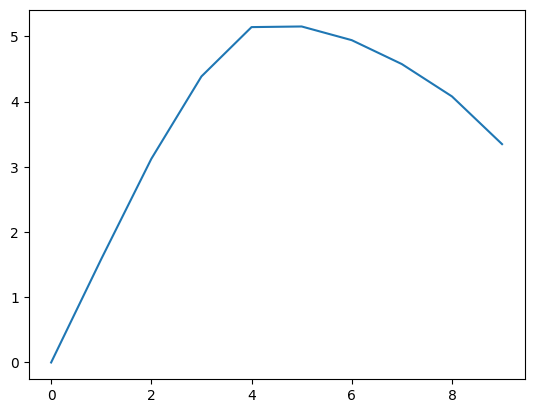

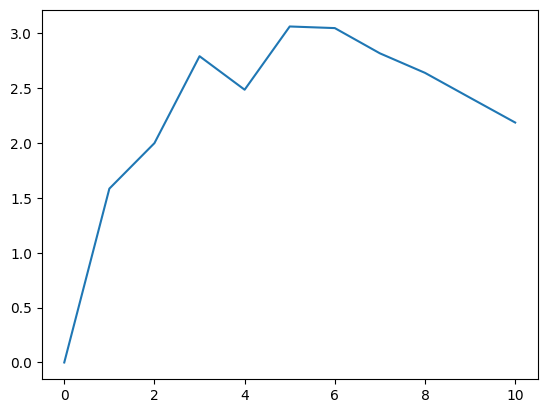

In [7]:
# Pyramid Compression
def split(im, entropy_lst):
    if im.shape[0] > 1:
        a = im[0:-1:2,0:-1:2]
        b = im[0:-1:2,1::2]-a
        c = im[1::2,0:-1:2]-a
        d = im[1::2,1::2]-a
        R = np.vstack((np.hstack((split(a, entropy_lst),b)),np.hstack((c,d))))
    else:
        R = im

    entropy_lst.append(entropy(R))
    # plt.figure()
    # plt.imshow(R)
    # plt.show()
    # print(entropy(R))

    return R

image1 = imread("camera.jpg").astype(np.int16)
image2 = imread("walking.jpg").astype(np.int16)

padded = np.zeros((1024,1024))
padded[:image2.shape[0],:image2.shape[1]] = image2

ent_list1 = []
pyramid1 = split(image1, ent_list1)
ent_list2 = []
pyramid2 = split(padded, ent_list2)

plt.figure()
plt.plot(ent_list1)
plt.show()

plt.figure()
plt.plot(ent_list2)
plt.show()

**Rebuild the original image** from the pyramid (allowing the selection the level of recursion)

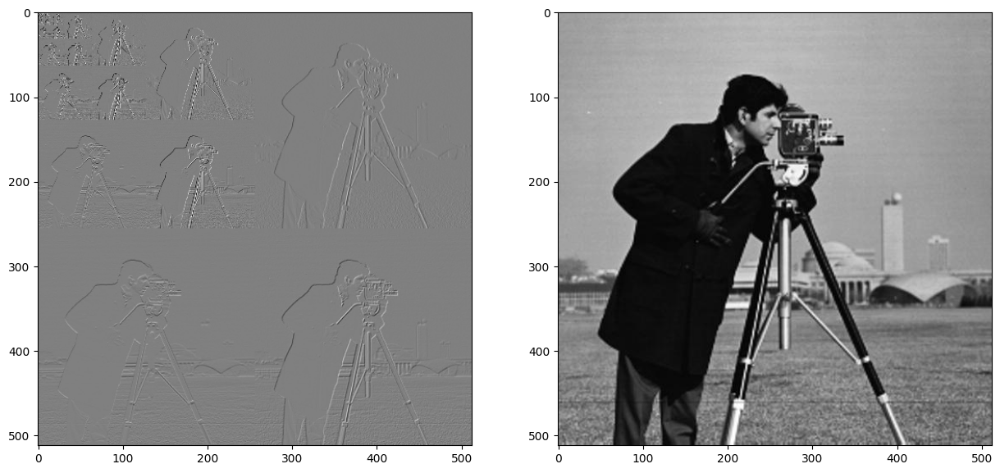

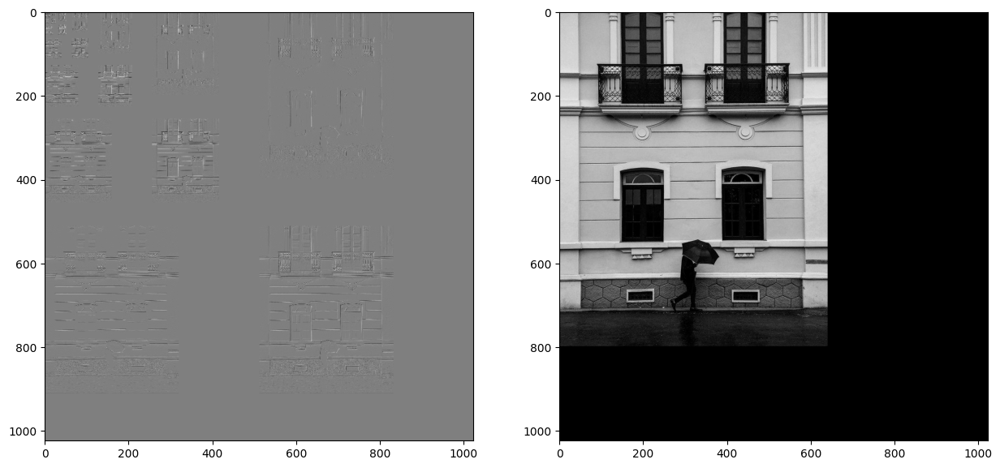

3.346722744534718
7.065452040742872


In [20]:
def reconstruct(im):
    if im.shape[0] % 2 != 0 or im.shape[1] % 2 != 0:
        return im
    else :
        midx = im.shape[0]//2
        midy = im.shape[1]//2

        a = reconstruct(im[:midx,:midy])
        b = im[:midx,midy:]
        c = im[midx:,:midy]
        d = im[midx:,midy:]

        im_prim = im.copy()
        im_prim[::2,::2] = a
        im_prim[::2,1::2] = b + a
        im_prim[1::2,::2] = c + a
        im_prim[1::2,1::2] = d + a

        return im_prim

compare(pyramid1, reconstruct(pyramid1))
compare(pyramid2, reconstruct(pyramid2))

print(entropy(pyramid1))
print(entropy(reconstruct(pyramid1)))

**Need more help? You can check the following videos:**

* [Subsampling and rescaling](https://www.youtube.com/watch?v=rYNUby5bIlA&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=7)
* [Pyramid compression](https://www.youtube.com/watch?v=yrsyF8T5OAU&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=8)

## 5. Co-occurrence matrix

While the histogram of an image is independent of the position of the pixels, the co-occurrence matrix gives us information about their spatial distribution.

A co-occurrence matrix is computed for a given displacement, looking at the pair of values spatially separated by that displacement. The co-occurrence matrix is a square matrix, its size given by the number of possible values that a pixels can take in the image.

1. Compute de [cooccurrence matrix](https://en.wikipedia.org/wiki/Co-occurrence_matrix) for a chosen displacement $(\Delta x,\Delta y)$ (see [greycomatrix](http://scikit-image.org/docs/dev/api/skimage.feature.html#skimage.feature.greycomatrix) in scikit-image)
1. What is the entropy of the cooccurrence matrix ?
1. How does this entropy evolve if we increase the displacement ?

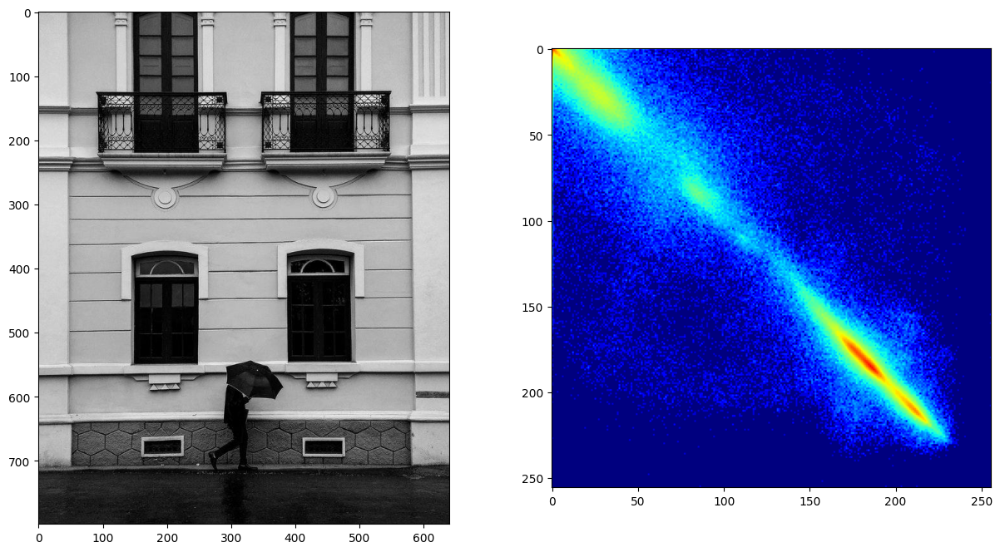

7.432795180644966
3.3478904263265483


In [9]:
from skimage.feature import greycomatrix

image = imread("walking.jpg")

# Log even with zero values
def log_nz(array):
    array[array == 0] = 1
    return np.log(array)

dx, dy = 1, 1

def co_occurrence(im, vector):
    C = np.zeros((256,256))
    for y in range(im.shape[0]-vector[1]):
        for x in range(im.shape[1]-vector[0]):
            i = im[y,x]
            j = im[y+vector[1],x+vector[0]]
            C[i,j] += 1

    return C

# use log to enhance the co-occurrence matrix
compare(image, log_nz(co_occurrence(image,(dx,dy))), opt2=plt.cm.jet)

print(entropy(image))
print(entropy(co_occurrence(image,(dx,dy))))

# Video 9, 16:20 for more information on greycomatrix

**Need more help? You can check the following videos:**

* [Grayscale co-occurence matrix](https://www.youtube.com/watch?v=cq0Br3zB2AU&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=9)

## 6. Colour representations

A colour image is typically encoded with three channels: Red, Green and Blue. In the example below, we open the *immunohistochemistry()* example image and split it into the three channels, which we display: 

(512, 512, 3) uint8


<Figure size 640x480 with 0 Axes>

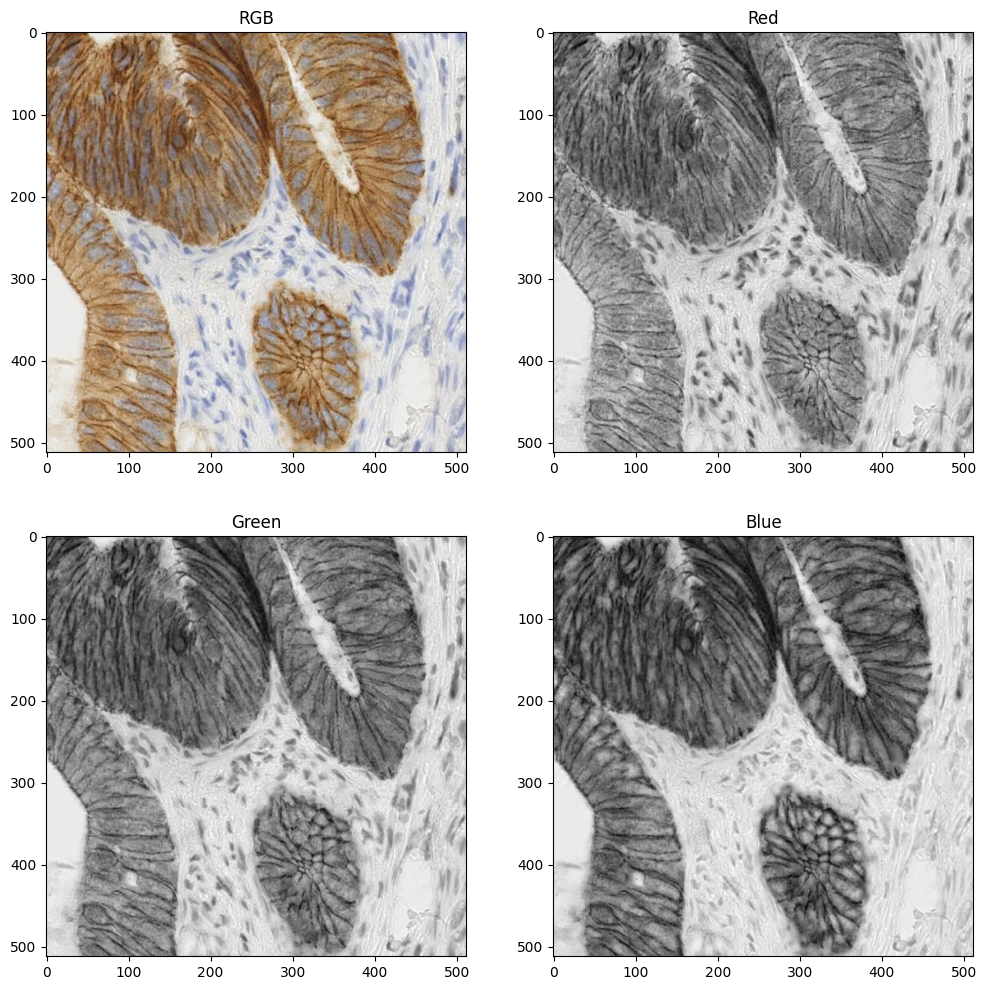

In [10]:
from skimage.data import immunohistochemistry

im = immunohistochemistry() # scikit-image method to load the example image
print(im.shape,im.dtype)
r = im[:,:,0]
g = im[:,:,1]
b = im[:,:,2]

plt.gray() # Use grayscale by default on 1-channel images, so you don't have to add cmap=plt.cm.gray everytime

def show():
    plt.figure(figsize=(12,12))
    plt.subplot(2,2,1)
    plt.imshow(im)
    plt.title('RGB')
    plt.subplot(2,2,2)
    plt.imshow(r)
    plt.title('Red')
    plt.subplot(2,2,3)
    plt.imshow(g)
    plt.title('Green')
    plt.subplot(2,2,4)
    plt.imshow(b)
    plt.title('Blue')
    plt.show()

show()

1. Compute & show the color histograms
1. Convert the image to the HSV color space & compute the HSV histograms. [See the skimage documentation for reference on color transformation](http://scikit-image.org/docs/dev/api/skimage.color.html#rgb2hsv)
1. Find a method to isolate the brown cells in the immunohistochemistry image
    1. In the RGB space
    1. In the HSV space

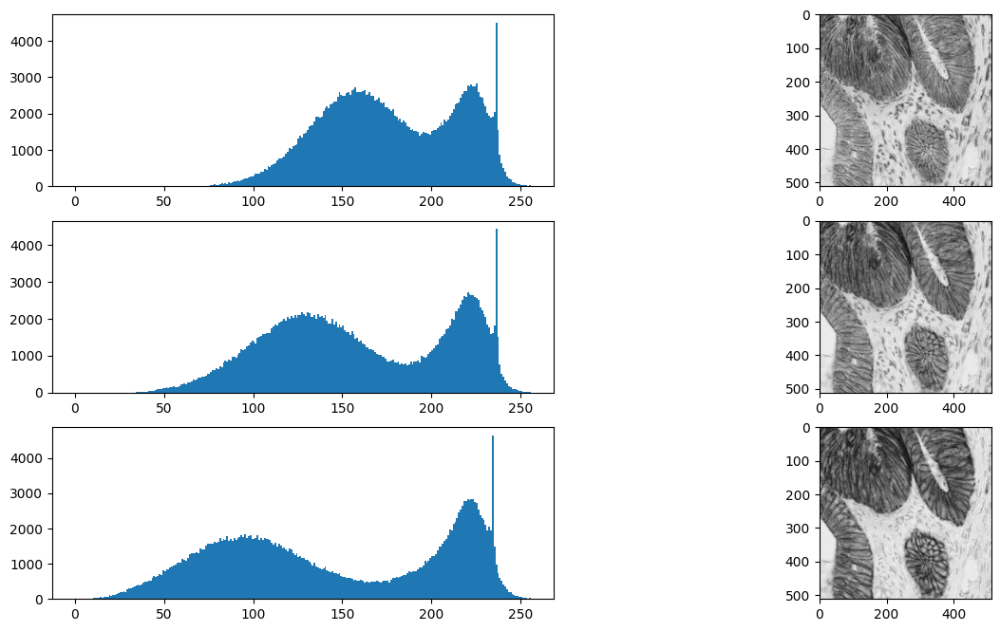

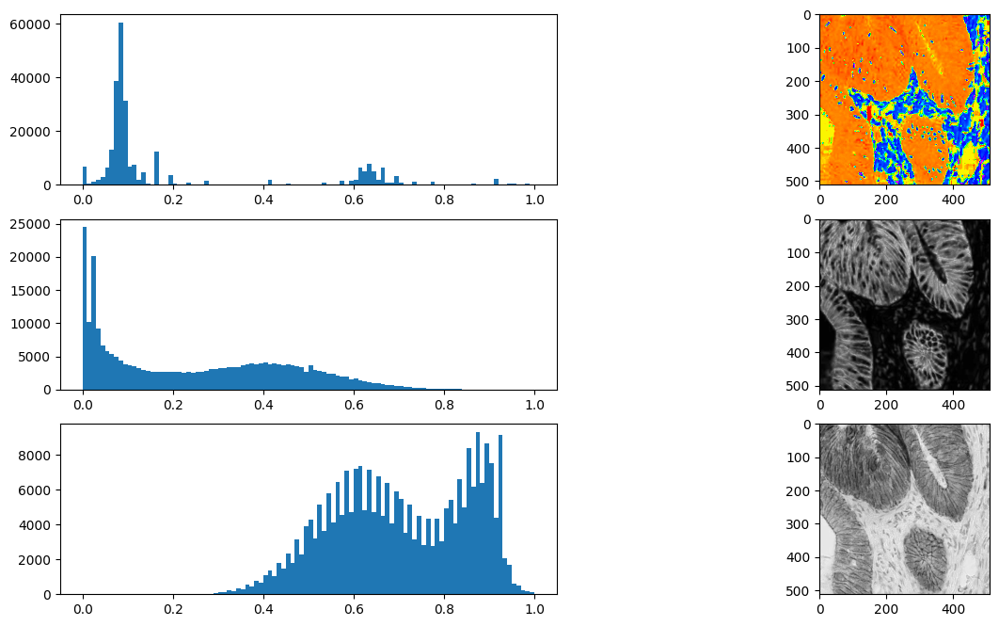

In [11]:
from skimage.color import rgb2hsv

image = immunohistochemistry()

# 1. Compute & show color histograms
def show_1():
    plt.figure(figsize=[15,8])
    plt.subplot(3,2,1)
    plt.hist(image[:,:,0].flatten(), bins=np.arange(257))
    plt.subplot(3,2,2)
    plt.imshow(image[:,:,0], plt.cm.gray)
    plt.subplot(3,2,3)
    plt.hist(image[:,:,1].flatten(), bins=np.arange(257))
    plt.subplot(3,2,4)
    plt.imshow(image[:,:,1], plt.cm.gray)
    plt.subplot(3,2,5)
    plt.hist(image[:,:,2].flatten(), bins=np.arange(257))
    plt.subplot(3,2,6)
    plt.imshow(image[:,:,2], plt.cm.gray)
    plt.show()

show_1()

# 2. Convert to HSV color space
im_hsv = rgb2hsv(image)

def show_2():
    plt.figure(figsize=[15,8])
    plt.subplot(3,2,1)
    plt.hist(im_hsv[:,:,0].flatten(), bins=np.arange(101)/100)
    plt.subplot(3,2,2)
    plt.imshow(im_hsv[:,:,0], plt.cm.hsv)
    plt.subplot(3,2,3)
    plt.hist(im_hsv[:,:,1].flatten(), bins=np.arange(101)/100)
    plt.subplot(3,2,4)
    plt.imshow(im_hsv[:,:,1], plt.cm.gray)
    plt.subplot(3,2,5)
    plt.hist(im_hsv[:,:,2].flatten(), bins=np.arange(101)/100)
    plt.subplot(3,2,6)
    plt.imshow(im_hsv[:,:,2], plt.cm.gray)
    plt.show()

show_2()

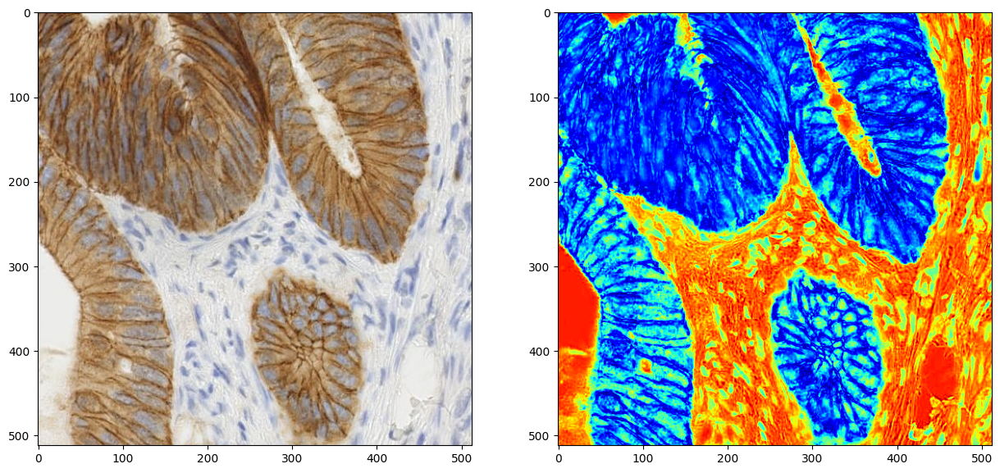

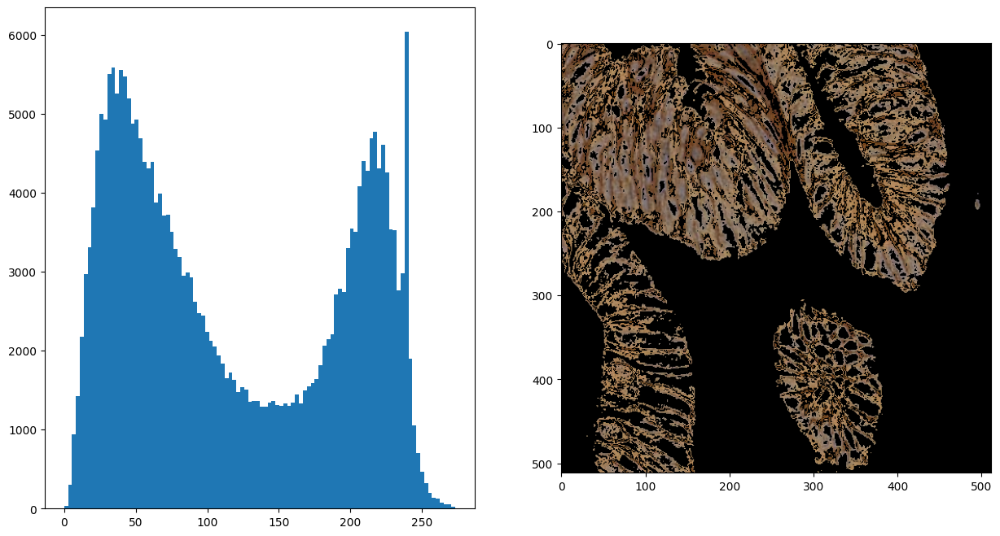

In [12]:

# 3. Isolate the brown cells
# RGB
def distance_color_map(image, coords):
    refcolor = image[coords[0], coords[1]]
    dmap = np.sqrt(((image-refcolor)**2).sum(axis=2))

    # dmap = np.zeros((image.shape[0], image.shape[1]))
    # for i in range(image.shape[0]):
    #     for j in range(image.shape[1]):
    #         dmap[i,j] = np.sqrt(((image[i,j] - refcolor)**2).sum())

    return dmap

# Compute distance color map
dmap = distance_color_map(image.astype(float), (1, 350))

compare(image, dmap, opt2=plt.cm.jet)


# Apply mask to 'Magic Wand' the image
mask1 = (dmap < 75)
mask2 = (dmap > 25)
image_cpy = image.copy()
image_cpy[mask1 == False] = 0
image_cpy[mask2 == False] = 0

# Compute histogram of distance map to see which color to keep
def show_rgb():
    plt.figure(figsize=[15,8])
    plt.subplot(1,2,1)
    plt.hist(dmap.flatten(), bins=100)
    plt.subplot(1,2,2)
    plt.imshow(image_cpy)
    plt.show()

show_rgb()

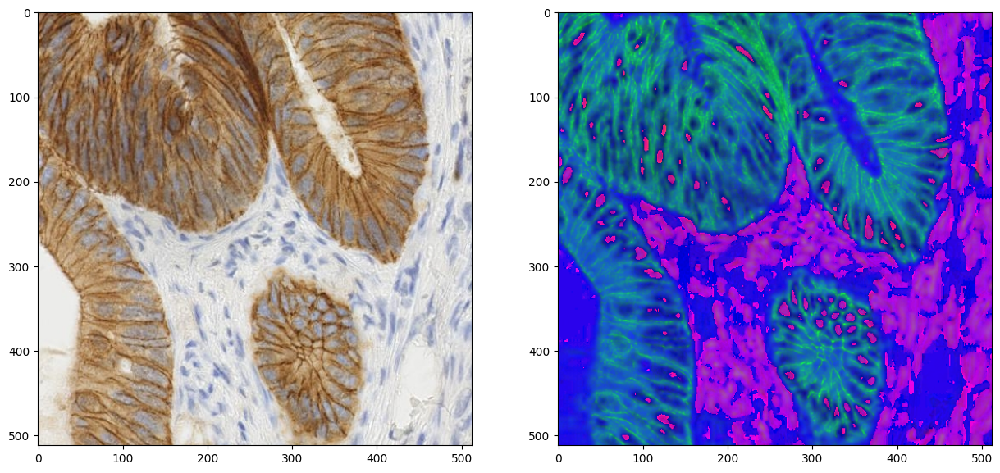

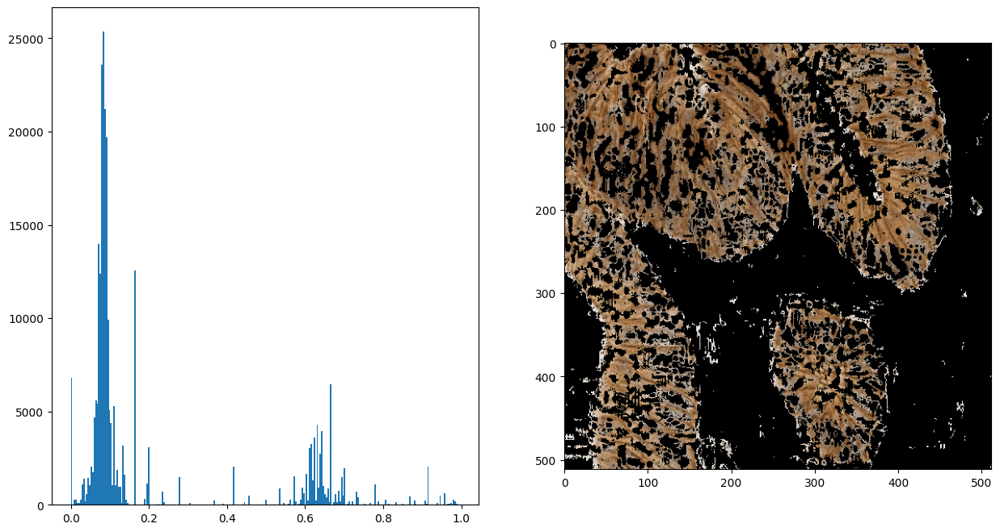

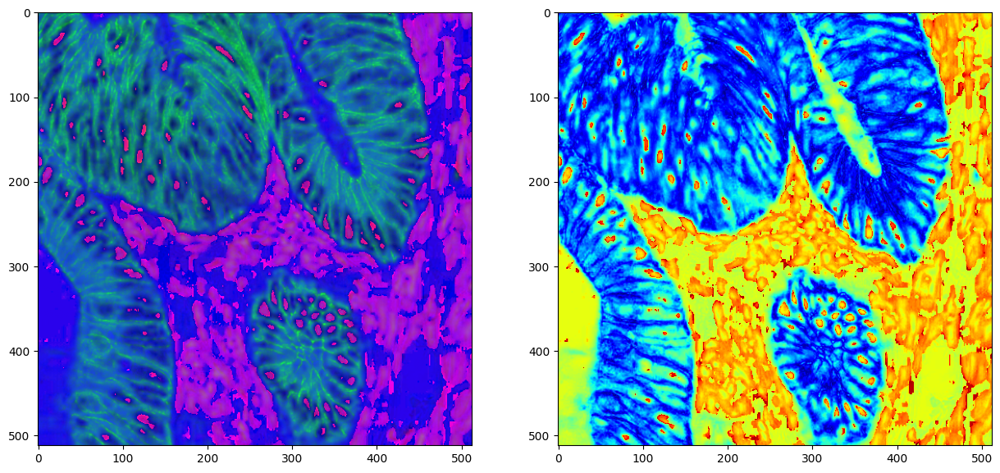

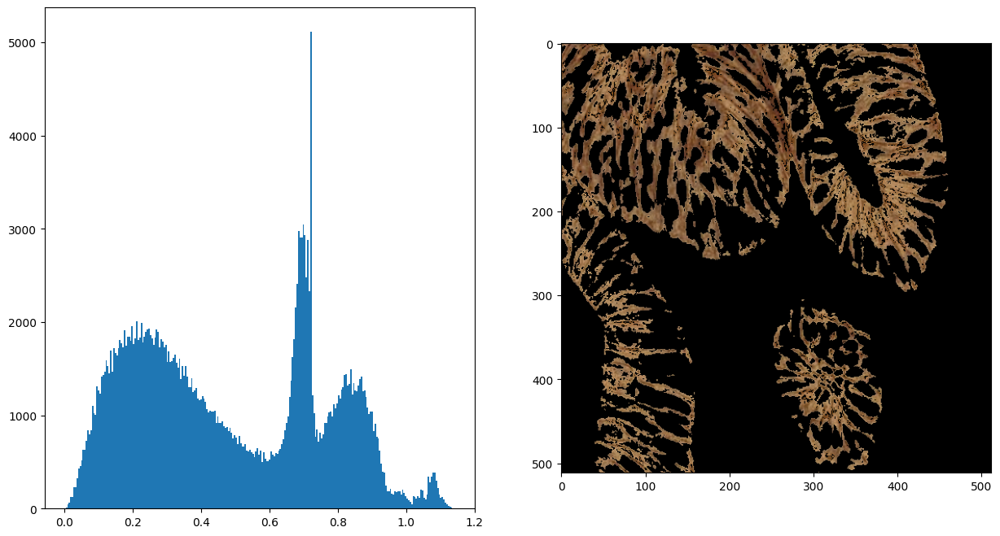

In [13]:

# HSV
# Show Hue histogram
compare(image, im_hsv)

mask3 = (im_hsv[:,:,0] < 0.09)
mask4 = (im_hsv[:,:,0] > 0.07)
image_copy = image.copy()
image_copy[mask3 == False] = 0
image_copy[mask4 == False] = 0

def show_hsv():
    plt.figure(figsize=[15,8])
    plt.subplot(1,2,1)
    plt.hist(im_hsv[:,:,0].flatten(), bins=256)
    plt.subplot(1,2,2)
    plt.imshow(image_copy)
    plt.show()

show_hsv()

# Same as before but with the HSV image
dmap_hsv = distance_color_map(im_hsv.astype(float), (1, 350))

compare(im_hsv, dmap_hsv, opt2=plt.cm.jet)


mask3 = (dmap_hsv > 0.05)
mask4 = (dmap_hsv < 0.25)
image_copy = image.copy()
image_copy[mask3 == False] = 0
image_copy[mask4 == False] = 0

def show_dmap_hsv():
    plt.figure(figsize=[15,8])
    plt.subplot(1,2,1)
    plt.hist(dmap_hsv.flatten(), bins=256)
    plt.subplot(1,2,2)
    plt.imshow(image_copy)
    plt.show()

show_dmap_hsv()

**Need more help? You can check the following videos:**

* [RGB vs HSV](https://www.youtube.com/watch?v=oVpSTZtZQNM&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=10)
* [Distances: image space and colour space](https://www.youtube.com/watch?v=f6aJJldc38E&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=11)
* [Creating a Magic Wand](https://www.youtube.com/watch?v=Aw--_cJ7o5I&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=12)

# Coding Project - Watermark

Write code to automatically add a watermark to a photograph.

<img src='ex_wm.jpg' width="500px" />

## Main requirements

The minimum requirements are to:
* Add the white pixels from the watermark somewhere in the photograph.
* Save the resulting image as an image file & display it in the notebook

You may use the *watermark.png* file available in the GitHub repository, or choose/create your own.

## Additional requirements

(note: this is not an exhaustive list, use your imagination!)

* Add an option to choose the watermark location
* Add transparency effect to the watermark
* Determine if the watermark should be dark or light based on the luminosity of the image
* ...


Dark image : False
Dark image : True
Dark image : False
Dark image : True


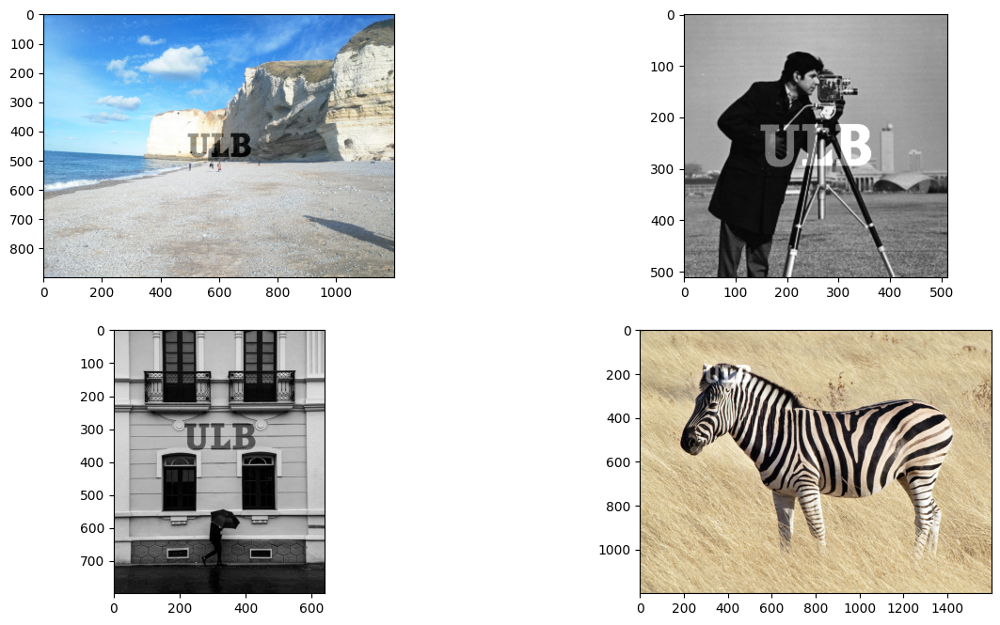

In [21]:
image1 = imread("etretat.jpg")
image2 = imread("camera.jpg")
image3 = imread("walking.jpg")
image4 = imread("zebra.jpg")

watermark = imread("watermark.png")


def watermark_image(im, watermark, darkness, coords):
    offset_x = round(coords[0] - watermark.shape[0]/2)
    offset_y = round(coords[1] - watermark.shape[1]/2)

    color_image = len(im.shape) == 3

    h = np.array(cumulative_histogram(im[offset_x:offset_x+watermark.shape[0],offset_y:offset_y+watermark.shape[1]]))
    if color_image:
        is_dark = watermark.shape[0]*watermark.shape[1]//2 < h[123]//3
    else:
        is_dark = watermark.shape[0]*watermark.shape[1]//2 < h[123]

    print("Dark image :", is_dark)
    if is_dark:
        darkness = -darkness

    image = im.copy()

    for x in range(watermark.shape[0]):
        for y in range(watermark.shape[1]):
            if watermark[x][y] != 0: # not black
                comp = 255 if is_dark else 0
                if color_image: # for color images
                    for i in range(3):
                        value = image[offset_x + x, offset_y + y, i] - darkness
                        image[offset_x + x, offset_y + y, i] = value if (value < comp if is_dark else value > comp) else comp
                else: # for gray-scale images
                    value = image[offset_x + x, offset_y + y] - darkness
                    image[offset_x + x, offset_y + y] = value if (value < comp if is_dark else value > comp) else comp

    return image

# coords = (image.shape[0]/2, image.shape[1]/2)
coords1 = (image1.shape[0]/2, image1.shape[1]/2)
coords2 = (image2.shape[0]/2, image2.shape[1]/2)
coords3 = (325, image3.shape[1]/2)
coords4 = (200,400)
darkness = 100

# result = watermark_image(image4, watermark, darkness, coords4)
# result = rgb2hsv(result)
# print(result[:,:,0].shape)
#
# plt.figure()
# plt.imshow(result[:,:,1]<.000001)
# plt.colorbar()
# plt.show()

def show():
    plt.figure(figsize=[15,8])
    plt.subplot(2,2,1)
    plt.imshow(watermark_image(image1, watermark, darkness, coords1))
    plt.subplot(2,2,2)
    plt.imshow(watermark_image(image2, watermark, darkness, coords2))
    plt.subplot(2,2,3)
    plt.imshow(watermark_image(image3, watermark, darkness, coords3))
    plt.subplot(2,2,4)
    plt.imshow(watermark_image(image4, watermark, darkness, coords4))
    plt.show()

show()